# Import dependencies

In [1]:
!pip install keras

In [2]:
!pip install cython

In [3]:
import sys
sys.path.append('Mask_RCNN')

In [4]:
import os
import sys
import random
import math
import re
import time
import gc; gc.enable()

import tensorflow as tf
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.InteractiveSession(config=config)
#sess = tf.Session(config=config)

from keras import backend as K
K.set_session(sess)

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import csv
import imageio
import skimage
from config import Config
from skimage.morphology import label
from skimage.feature import canny
from skimage import exposure
from keras.callbacks import Callback
from skimage.morphology import binary_closing, binary_opening, disk, binary_dilation
from scipy.ndimage.morphology import binary_fill_holes
from sklearn.externals import joblib
from skimage.transform import PiecewiseAffineTransform, warp
from skimage.morphology import watershed
from skimage.filters import sobel
from preparation import vgg_feature_extractor
from random import *

import gc; gc.enable()
import utils
import model as modellib
import visualize
from model import log

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Let's download the mask_rcnn trained on COCO dataset to initialize the model.

In [5]:
pd.options.display.max_rows=100

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

We will now define the monitor that will help keep track on the training process.
With this you will be able to see your charts in the `charts` tab

Now we will load the metadata and divide them in train and valid splits

In [6]:
TRAIN_PATH = '../stage1_train'
TEST_PATH = '../stage1_test'
META_DATA_PATH = '../stage1_metadata.csv'
BG_DATA_PATH = '../stage1_backgroud_foreground_classes.csv'

In [7]:
if not os.path.exists(META_DATA_PATH):
    print('Generating stage1_metadata.csv')
    
    stage1_metadata = pd.DataFrame()
    
    train_image_ids = os.listdir(TRAIN_PATH) # ImageId
    train_is_train = [1] * len(train_image_ids)
    
    train_file_path = []
    for p in train_image_ids:
        if p[:4] == 'TCGA':
            train_file_path.append(TRAIN_PATH + '/' + p + '/images/' + p + '.tif')
        else:
            train_file_path.append(TRAIN_PATH + '/' + p + '/images/' + p + '.png')
    
    test_image_ids = os.listdir(TEST_PATH) # ImageId
    test_is_train = [0] * len(test_image_ids)
    test_file_path = [TEST_PATH + '/' + p + '/images/' + p + '.png' for p in test_image_ids]
    
    stage1_metadata['ImageId'] = np.concatenate([train_image_ids, test_image_ids], axis=0)
    stage1_metadata['is_train'] = np.concatenate([train_is_train, test_is_train], axis=0)
    stage1_metadata['file_path_image'] = np.concatenate([train_file_path, test_file_path], axis=0)
    
    ve = vgg_feature_extractor(n_clusters=10)
    train_vgg_features_clusters = ve.get_vgg_clusters(stage1_metadata[stage1_metadata.is_train == 1].reset_index(drop=True), is_train=True)
    test_vgg_features_clusters =ve.get_vgg_clusters(stage1_metadata[stage1_metadata.is_train == 0].reset_index(drop=True), is_train=False)
    
    stage1_metadata['vgg_features_clusters'] = np.concatenate([train_vgg_features_clusters, test_vgg_features_clusters], axis=0)
    
    stage1_metadata.to_csv(META_DATA_PATH, index=False)
    meta = stage1_metadata
    
    del vgg_feature_extractor; gc.collect()
else:
    meta = pd.read_csv(META_DATA_PATH)
    

meta.head(100)

,ImageId,is_train,file_path_image,vgg_features_clusters
0,ef6634efb46567d87b811be786b18c4cd0e2cda23d79b6...,1,../stage1_train/ef6634efb46567d87b811be786b18c...,1
1,351771edfc5db5665ded8aa4940257276b6526663c76e3...,1,../stage1_train/351771edfc5db5665ded8aa4940257...,6
2,785555c0cbb49dad835635217085287a8cc61c27d26f0e...,1,../stage1_train/785555c0cbb49dad83563521708528...,4
3,7ba20aa731cc21af74a8d940254176cbad1bdc44f240b5...,1,../stage1_train/7ba20aa731cc21af74a8d940254176...,1
4,43cf6b2ec0b0745ac2b87b4d8780f62e9050d3f5d50a1f...,1,../stage1_train/43cf6b2ec0b0745ac2b87b4d8780f6...,3
5,0b2e702f90aee4fff2bc6e4326308d50cf04701082e718...,1,../stage1_train/0b2e702f90aee4fff2bc6e4326308d...,4
6,61dc249314d7b965eb4561ec739eab9b0f60af55c97b25...,1,../stage1_train/61dc249314d7b965eb4561ec739eab...,6
7,28d33efef218392e79e385906deb88055d94b65ad217de...,1,../stage1_train/28d33efef218392e79e385906deb88...,0
8,4596961c789d3b41916492918797724fe75128239fefc5...,1,../stage1_train/4596961c789d3b4191649291879772...,6
9,1ec74a26e772966df764e063f1391109a60d803cff9d15...,1,../stage1_train/1ec74a26e772966df764e063f13911...,9


In [8]:
back_ground_df = pd.read_csv(BG_DATA_PATH)
back_ground_df.tail(100)

,filename,foreground,background
665,589f86dee5b480a88dd4f77eeaffe2c4d70aefdf879a40...,purple,purple
666,442c4eb0185698fe7d148c108a46f74abd399aecda2f4f...,purple,purple
667,709e094e39629a9ca21e187f007b331074694e443db402...,purple,purple
668,6b0ac2ab04c09dced54058ec504a4947f8ecd5727dfca7...,purple,purple
669,87ea72894f6534b28e740cc34cf5c9eb75d0d8902687fc...,purple,purple
670,b0e35e06b85da49bfe3ea737711a72b551a6add446e30e...,purple,purple
671,f952cc65376009cfad8249e53b9b2c0daaa3553e897096...,purple,purple
672,6d327ab4f0e3604fa6e9b8041c7e6db86ab809890d886c...,purple,purple
673,e49fc2b4f1f39d481a6525225ab3f688be5c87f5688445...,purple,purple
674,a90401357d50e1376354ae6e5f56a2e4dff3fdb5a4e8d5...,purple,purple


In [9]:
back_ground_df['ImageId'] = [fn.replace('.png', '') if fn[-4:] == '.png' else fn.replace('.tif', '') for fn in back_ground_df.filename]
print('Image ID in background data counts:\n', meta.ImageId.isin(back_ground_df.ImageId).value_counts())

Image ID in background data counts:
 True    759
Name: ImageId, dtype: int64


In [10]:
back_ground_df.background.value_counts()

black     599
purple    101
white      57
yellow      8
Name: background, dtype: int64

In [11]:
back_ground_df.foreground.value_counts()

white     599
purple    150
black      16
Name: foreground, dtype: int64

In [12]:
back_ground_df['composed_bf_ground'] = back_ground_df.background.astype(str) + '_' + back_ground_df.foreground.astype(str)
back_ground_df.composed_bf_ground.value_counts()

black_white      599
purple_purple    101
white_purple      41
white_black       16
yellow_purple      8
Name: composed_bf_ground, dtype: int64

### How to deal with it:
1. yellow_purple, white_black -> reverse to black_white
2. white_purple, purple_purple -> change to white black. (the foreground seems darker in these cases)
3. Separate into two groups: 1. + 2.

In [13]:
back_ground_df = back_ground_df.set_index('ImageId')
back_ground_df.head(10)

,filename,foreground,background,composed_bf_ground
ImageId,,,,
d32ea6d318626ca14a967d0c1ad3218aebfe636624a8d1173f5150dde8ff38cf,d32ea6d318626ca14a967d0c1ad3218aebfe636624a8d1...,white,black,black_white
4596961c789d3b41916492918797724fe75128239fefc516c3ee75322b7926f0,4596961c789d3b41916492918797724fe75128239fefc5...,white,black,black_white
b6edad733399c83c8eb7a59c0d37b54e10cc0d59894e39ff843884d84f61dee1,b6edad733399c83c8eb7a59c0d37b54e10cc0d59894e39...,white,black,black_white
831218e6a1a54b23d4be56c5799854e7eb978811b89215319dc138900bd563e6,831218e6a1a54b23d4be56c5799854e7eb978811b89215...,white,black,black_white
b1e3aeb0c56261c17eb71c747d116057b8da7e8c8a6845bdc01b2b3ee2299229,b1e3aeb0c56261c17eb71c747d116057b8da7e8c8a6845...,white,black,black_white
4a424e0cb845cf6fd4d9fe62875552c7b89a4e0276cf16ebf46babe4656a794e,4a424e0cb845cf6fd4d9fe62875552c7b89a4e0276cf16...,white,black,black_white
43cf6b2ec0b0745ac2b87b4d8780f62e9050d3f5d50a1fcefa42d166191e84c6,43cf6b2ec0b0745ac2b87b4d8780f62e9050d3f5d50a1f...,white,black,black_white
f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8bc639d4121c1672ff7,f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8...,white,black,black_white
bf7691b0a79811fa068b7408cbce636a73f01ef9e971a95da1a2d96df73782b6,bf7691b0a79811fa068b7408cbce636a73f01ef9e971a9...,white,black,black_white


In [14]:
meta['bg_type'] = meta.ImageId.map(back_ground_df.composed_bf_ground)
meta['bg_type'].value_counts()

black_white      594
purple_purple    100
white_purple      41
white_black       16
yellow_purple      8
Name: bg_type, dtype: int64

In [15]:
meta[meta['is_train']==1].bg_type.value_counts()

black_white      541
purple_purple     99
white_purple      38
white_black       16
Name: bg_type, dtype: int64

In [16]:
meta[meta['is_train']==0].bg_type.value_counts()

black_white      53
yellow_purple     8
white_purple      3
purple_purple     1
Name: bg_type, dtype: int64

In [17]:
meta['process_type'] = meta['bg_type'].map({
    'black_white': 2, # do nothing
    'white_black': 3, # pure reverse
    'purple_purple': 1, # do nothing
    'yellow_purple': 1, # turns into gray and reverse
    'white_purple': 1 # do nothing
})
meta['process_type'].value_counts()

2    594
1    149
3     16
Name: process_type, dtype: int64

In [18]:
meta['group'] = meta['bg_type'].map({
    'black_white': 0,
    'white_black': 0,
    'purple_purple': 1,
    'yellow_purple': 0,
    'white_purple': 1
})
meta['group'].value_counts()

0    759
Name: group, dtype: int64

In [19]:
def train_val_split(meta_train, val_size=0.1, random_state=719):
    meta_train_groups = [meta_train[meta_train['group'] == group].reset_index(drop=True) for group in range(1)]
    
    meta_train_val_groups = []
    
    for train_group in meta_train_groups:
        meta_train_val_groups
        
        val = train_group.sample(frac=val_size, random_state=random_state)
        tr = train_group[~train_group.index.isin(val.index)]
        
        meta_train_val_groups.append((tr, val))
    
    return meta_train_val_groups

def train_split(meta_train):
    meta_train_groups = [meta_train[meta_train['group'] == group].reset_index(drop=True) for group in range(1)]
    return meta_train_groups

In [20]:
IS_DEVELOP = False
if IS_DEVELOP:
    VAL_SIZE = .3
else:
    VAL_SIZE = 0.01

In [21]:
meta_train = meta[meta['is_train']==1]
meta_test = meta[meta['is_train']==0]
meta_train_val_groups = train_val_split(meta_train, val_size=VAL_SIZE, random_state=519)

for i in range(1):
    print(meta_train_val_groups[i][0].shape, meta_train_val_groups[i][1].shape)

(687, 7) (7, 7)


# Mask-RCNN configuration
We will now define parameters for our mask-rcnn. 
Tweak them to get better results!

In [22]:
class DsbConfig(Config):

    # Give the configuration a recognizable name
    NAME = "dsb"
      
    LEARNING_RATE = 1e-2
    
    # If enabled, resizes instance masks to a smaller size to reduce
    # memory load. Recommended when using high-resolution image
    USE_MINI_MASK = True
    MINI_MASK_SHAPE = (56, 56)  # (height, width) of the mini-mask
    
    # Train on 1 GPU and 8 images per GPU. Batch size is GPUs * images/GPU.
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    # Total number of steps (batches of samples) to yield from generator before declaring one epoch finished and starting the next epoch.
    # typically be equal to the number of samples of your dataset divided by the batch size
    STEPS_PER_EPOCH = 300
    VALIDATION_STEPS = 70

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + nucleis
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    IMAGE_PADDING = True  # currently, the False option is not supported
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels, maybe add a 256?
    # The strides of each layer of the FPN Pyramid. These values
    # are based on a Resnet101 backbone.
    BACKBONE_STRIDES = [4, 8, 16, 32, 64]
    # How many anchors per image to use for RPN training
    RPN_TRAIN_ANCHORS_PER_IMAGE = 320 #300
    
    # ROIs kept after non-maximum supression (training and inference)
    POST_NMS_ROIS_TRAINING = 2000
    POST_NMS_ROIS_INFERENCE = 2000
    POOL_SIZE = 7
    MASK_POOL_SIZE = 14 # 14
    MASK_SHAPE = [28, 28] # 28
    TRAIN_ROIS_PER_IMAGE = 512
    RPN_DETECTION_MIN_CONFIDENCE = .6
    RPN_NMS_THRESHOLD = 0.6 #0.7
    MAX_GT_INSTANCES = 256
    DETECTION_MAX_INSTANCES = 450 
    # Minimum probability value to accept a detected instance
    # ROIs below this threshold are skipped
    DETECTION_MIN_CONFIDENCE = 0.67 # may be smaller?
    # Non-maximum suppression threshold for detection
    DETECTION_NMS_THRESHOLD = 0.3 # 0.3
    
    # DETECTION_MAX_INSTANCES=400, DETECTION_MIN_CONFIDENCE=.7 => Val loss: .21xx, LB: .424
    # DETECTION_MAX_INSTANCES=450, DETECTION_MIN_CONFIDENCE=.65 => Val loss: .3, LB: .438
    # DETECTION_MAX_INSTANCES=, DETECTION_MIN_CONFIDENCE= => Val loss: ., LB: .
    
    '''
    0324 note: 
        RPN_NMS_THRESHOLD .7 -> .6 to generate more proposals at training,
        DETECTION_MAX_INSTANCES 400 -> 450
        DETECTION_MIN_CONFIDENCE .7
        BACKBONE_STRIDES add `2` ..?
    '''
    
    MEAN_PIXEL = np.array([0.,0.,0.])
    
    # Weight decay regularization
    WEIGHT_DECAY = 0.0001
    
    # Min Box Size
    MIN_BOX_SIZE = 36./(512.**2.) # (36/512**2) (delete objects smaller than 6*6 pixels)
    BORDER_RATIO = 4. / 512. # smaller than 4 pixels width\height at the border
    BORDER_MIN_BOX_SIZE = 16./(512.**2.)
  
    LR_SHRINK_PERIOD = 10
    
config = DsbConfig()

# Dataset definition

We need to define our datasets for the data science bowl competition

In [23]:
from augment import Augment

class DsbDataset(utils.Dataset):
    '''
    process_info is a image-id <=> process type mapping pd.series
    '''
    def load_dataset(self, process_info, train_mode=True, augment=False):
        self.add_class("dsb", 1, "nuclei")
        self.process_info = process_info
        self.augmenter = Augment()
        self.augment = augment
        
        if train_mode:
            directory = dsb_dir
        else:
            directory = test_dir
            
        ids = []
        for i, id in enumerate(process_info.ImageId.values):
            image_dir = os.path.join(directory, id)
            self.add_image("dsb", image_id=i, path=image_dir)
            ids.append(i)
        
        self.process_info.reset_index(drop=True, inplace=True)
        #print(self.process_info)
        self.process_info['id'] = ids
        self.process_info.set_index('id')
        self.process_info = self.process_info['process_type']
        #print(self.process_info)
        
    def load_image(self, image_id, non_zero=None):
        info = self.image_info[image_id]
        path = info['path']
        image_name = os.listdir(os.path.join(path, 'images'))
        image_path = os.path.join(path, 'images', image_name[0])
        image = imageio.imread(image_path)
        
        #print(self.process_info[image_id])
        if image_path[-4:] == '.tif':
            self.offset = (randrange(488), randrange(488))
            image = image[self.offset[0]:self.offset[0]+512, self.offset[1]:self.offset[1]+512, :]
            #image = skimage.transform.resize(image, (512,512),  preserve_range=True)
        
        if image.shape[2] != 3:
            image = image[:,:,:3]

        image = self.preprocess(image, process_type=self.process_info[image_id])
        image = image.astype('float32')
        
        if self.augment:
            self.augment_func = self.augmenter.get_random_augement()
            image = self.augment_func(image)
            
        return image

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "shapes":
            return info["shapes"]
        else:
            super(self.__class__).image_reference(self, image_id)

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        path = info['path']
        mask_dir = os.path.join(path, 'masks')
        mask_names = os.listdir(mask_dir)
        count = len(mask_names)
        mask = []
        
        for i, el in enumerate(mask_names):
            msk_path = os.path.join(mask_dir, el)
            msk = imageio.imread(msk_path)
            if np.sum(msk) == 0:
                print('invalid mask')
                continue
                
            if 'TCGA' in mask_dir:
                #msk = skimage.transform.resize(msk, (512,512), preserve_range=True)
                msk = msk[self.offset[0]:self.offset[0]+512, self.offset[1]:self.offset[1]+512]
                if np.sum(msk) == 0:
                    continue
                
            msk = msk.astype('float32')/255.
            
            if len(msk.shape) > 2:
                msk = np.sum(msk, axis=2)
                
            mask.append(msk)
            
        try:
            mask = np.array(mask)
        except:
            for i, m in enumerate(mask):
                if len(m.shape) > 2:
                    print(mask_names[i])
                    
        mask[mask > 0.] = 1.
        mask = np.transpose(mask, (1,2,0))
        if self.augment:
            mask = self.augment_func(mask) # self.augment_func was decided when loading image before loading masks
            
        occlusion = np.logical_not(mask[:, :, -1]).astype(np.uint8)
        count = mask.shape[2]
        for i in range(count-2, -1, -1):
            mask[:, :, i] = mask[:, :, i] * occlusion
            occlusion = np.logical_and(occlusion, np.logical_not(mask[:, :, i]))
        class_ids = [self.class_names.index('nuclei') for s in range(count)]
        class_ids = np.asarray(class_ids)
        
        return mask, class_ids.astype(np.int32)
    
    def preprocess(self, img, process_type=0):
        
        if process_type == 0: # grey-rgb-grey
            gray = skimage.color.rgb2gray(img.astype('uint8'))
            img = skimage.color.gray2rgb(gray)
            img *= 255.
        elif process_type == 1:  # grey-rgb-grey-reverse
            gray = skimage.color.rgb2gray(img.astype('uint8'))
            img = skimage.color.gray2rgb(gray)
            img *= 255.
            img = 255. - img
        elif process_type == 2:
            pass # do nothing
        elif process_type == 3:
            img = 255. - img
        
        return img

In [24]:
dsb_dir = TRAIN_PATH
test_dir = TEST_PATH

In [25]:
'''
for i in range(2):
    print(meta_train_val_groups[i][0].shape, meta_train_val_groups[i][1].shape)
'''

datasets = []
for i in range(1):
    
    tr, val = meta_train_val_groups[i]

    # Training dataset
    dataset_train = DsbDataset()
    dataset_train.load_dataset(tr[['ImageId', 'process_type']], augment=True)
    dataset_train.prepare()

    # Validation dataset
    dataset_val = DsbDataset()
    dataset_val.load_dataset(val[['ImageId', 'process_type']])
    dataset_val.prepare()
    
    datasets.append((dataset_train, dataset_val))

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Let's take a look at some images

# Evaluate
I think we are ready to see how our model does on the validation!

In [26]:
class InferenceConfig(DsbConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # MEAN_PIXEL = np.array([56.02288505, 54.02376286, 54.26675248])

    USE_FLEXIBLE_NMS = True
    DETECTION_MIN_CONFIDENCE = 0.88
    DETECTION_NMS_THRESHOLD = 0.3
    SNMS_METHOD = 2 # 0: normal greedy nms, 1: linear method 2: Gaussian method
    SNMS_SIGMA = 0.5

inference_config = InferenceConfig()

In [27]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [28]:
test_ids = os.listdir(test_dir)

In [29]:
def test_split(meta_test):
    meta_test_groups = [meta_test[meta_test['group'] == group].reset_index(drop=True) for group in range(1)]
    return meta_test_groups

In [30]:
meta_test_groups = test_split(meta_test)

In [31]:
test_datasets = []
for i in range(1):
    
    te = meta_test_groups[i]

    # Testing dataset
    dataset_test = DsbDataset()
    dataset_test.load_dataset(te[['ImageId', 'process_type']], train_mode=False)
    dataset_test.prepare()
    
    test_datasets.append(dataset_test)

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [32]:
from prediction_saver import prediction_saver

In [33]:
from time import time
start_time = time()
PRED_SAVER_DIR = os.path.join(ROOT_DIR, "prediction_savers_ver1")
ps = prediction_saver(PRED_SAVER_DIR, meta_test.ImageId.values)

PRED_SAVER_DIR2 = os.path.join(ROOT_DIR, "prediction_savers_ver1_7090")
ps2 = prediction_saver(PRED_SAVER_DIR2, meta_test.ImageId.values)

In [34]:
def rle_encoding(x):
    '''
    x: numpy array of shape (height, width), 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = np.where(x.T.flatten()==1)[0] # .T sets Fortran order down-then-right
    run_lengths = []
    prev = -2
    for b in dots:
        if (b>prev+1): run_lengths.extend((b+1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths

In [35]:
def numpy2encoding_no_overlap(predicts, img_name, scores):
    sum_predicts = np.sum(predicts, axis=2)
    rows, cols = np.where(sum_predicts>=2)
    
    for i in zip(rows, cols):
        instance_indicies = np.where(np.any(predicts[i[0],i[1],:]))[0]
        highest = instance_indicies[0]
        predicts[i[0],i[1],:] = predicts[i[0],i[1],:]*0
        predicts[i[0],i[1],highest] = 1
    
    ImageId = []
    EncodedPixels = []
    #print(predicts.shape)
    for i in range(predicts.shape[2]): 
        rle = rle_encoding(predicts[:,:,i])
        if len(rle)>0:
            ImageId.append(img_name)
            EncodedPixels.append(rle)    
    return ImageId, EncodedPixels

In [36]:
new_test_ids = []
rles = []

def update_final_predictions(test_ids, predictions, new_test_ids, rles):
    
    for id, raw_pred in zip(test_ids, predictions):
        ids, rle = numpy2encoding_no_overlap(raw_pred[0], id, raw_pred[1])
        new_test_ids += ids
        rles += rle
    
    return new_test_ids, rles

Orignal masks# = 12  => Voted for next level flexible nms masks# = 12
Orignal masks# = 10  => Voted for next level flexible nms masks# = 10
Orignal masks# = 24  => Voted for next level flexible nms masks# = 24
Orignal masks# = 8  => Voted for next level flexible nms masks# = 8
Orignal masks# = 22  => Voted for next level flexible nms masks# = 22
Orignal masks# = 91  => Voted for next level flexible nms masks# = 91
Orignal masks# = 12  => Voted for next level flexible nms masks# = 12
Orignal masks# = 48  => Voted for next level flexible nms masks# = 48
Orignal masks# = 75  => Voted for next level flexible nms masks# = 75
Orignal masks# = 177  => Voted for next level flexible nms masks# = 177
Orignal masks# = 156  => Voted for next level flexible nms masks# = 156
Orignal masks# = 121  => Voted for next level flexible nms masks# = 121
Orignal masks# = 28  => Voted for next level flexible nms masks# = 28
Orignal masks# = 16  => Voted for next level flexible nms masks# = 16
Orignal masks# =

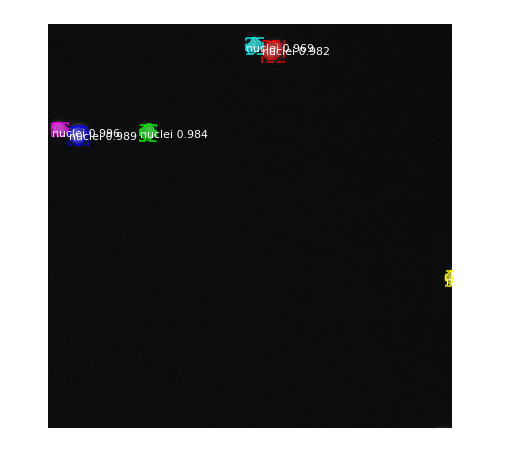

image  0  processed, bg type = black_white 
id = d8d4bf68a76e4e4c5f21de7ac613451f7115a04db686151e78b8ec0b6a22022b


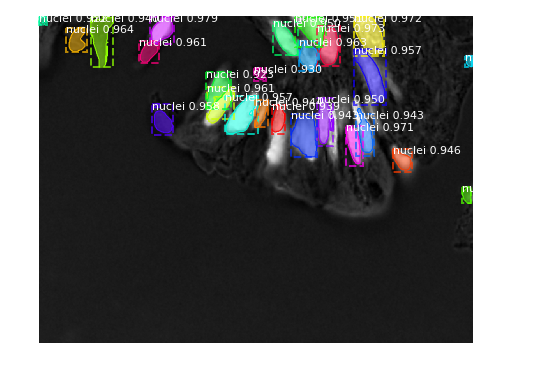

image  1  processed, bg type = yellow_purple 
id = f5effed21f671bbf4551ecebb7fe95f3be1cf09c16a60afe64d2f0b95be9d1eb


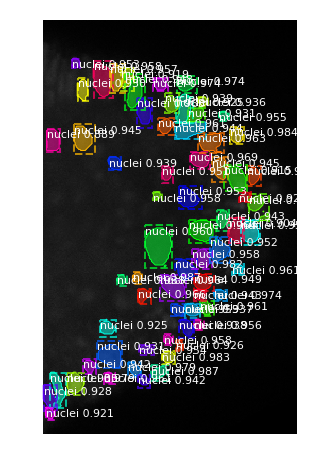

image  2  processed, bg type = black_white 
id = 4f949bd8d914bbfa06f40d6a0e2b5b75c38bf53dbcbafc48c97f105bee4f8fac


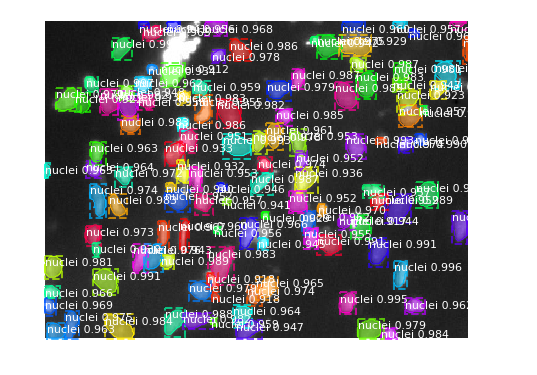

image  3  processed, bg type = black_white 
id = 43a71aeb641faa18742cb826772a8566c6c947d7050f9ab15459de6cc2b3b6af


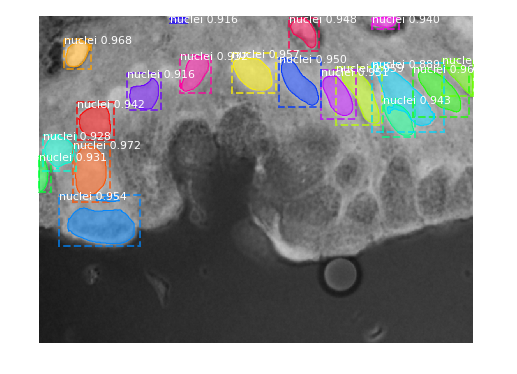

image  4  processed, bg type = white_purple 
id = 259b35151d4a7a5ffdd7ab7f171b142db8cfe40beeee67277fac6adca4d042c4


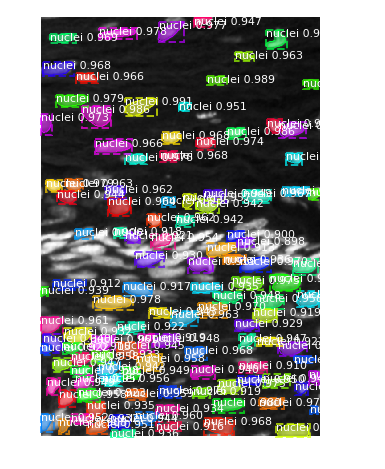

image  5  processed, bg type = yellow_purple 
id = b83d1d77935b6cfd44105b54600ffc4b6bd82de57dec65571bcb117fa8398ba3


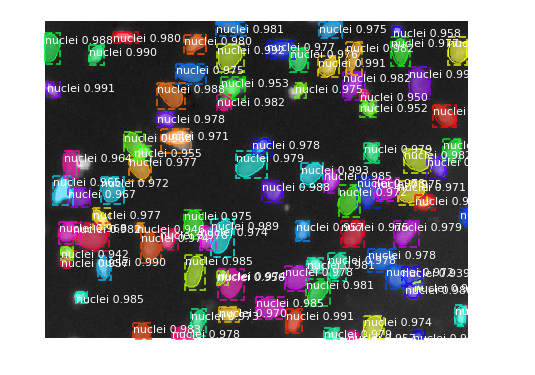

image  6  processed, bg type = black_white 
id = df40099c6306ca1f47fcc8a62e2fa39486d4e223177afdc51b2ad189691802d8


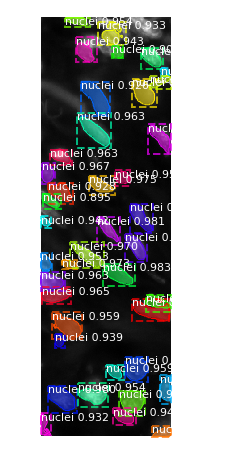

image  7  processed, bg type = black_white 
id = ca20076870e8fb604e61802605a9ac45419c82dd3e23404c56c4869f9502a5ef


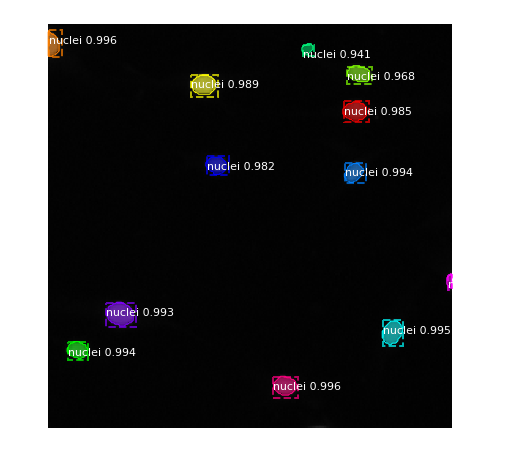

image  8  processed, bg type = black_white 
id = 38f5cfb55fc8b048e82a5c895b25fefae7a70c71ab9990c535d1030637bf6a1f


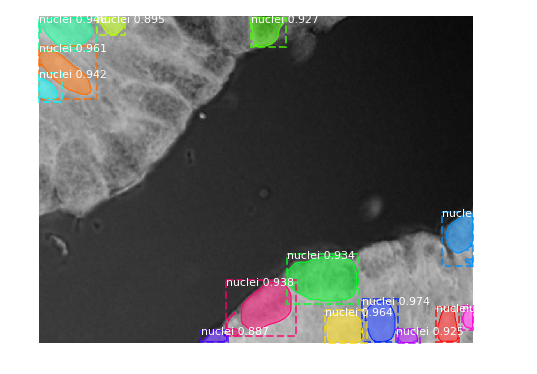

image  9  processed, bg type = white_purple 
id = 17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff


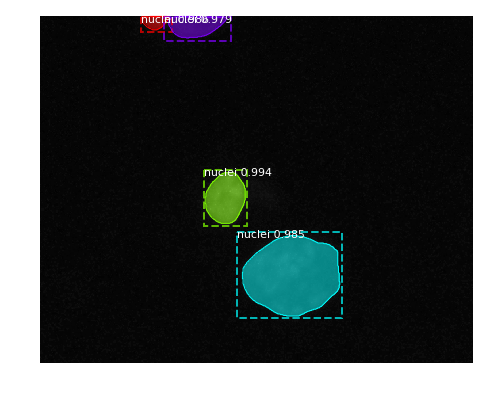

image  10  processed, bg type = black_white 
id = 505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81


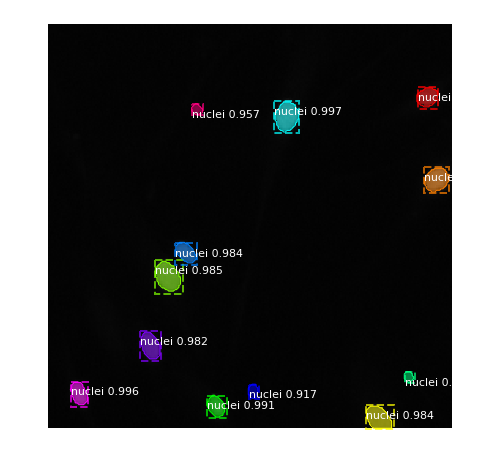

image  11  processed, bg type = black_white 
id = dab46d798d29aff2e99c23f47ed3064f5cafb1644629b015c95a2dd2ee593bb4


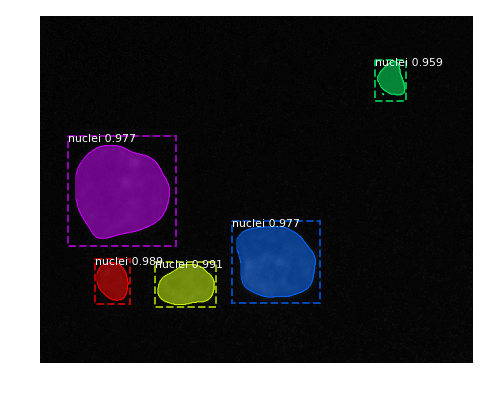

image  12  processed, bg type = black_white 
id = 1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b


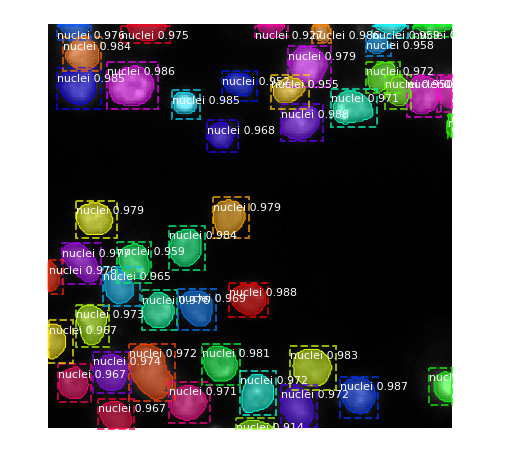

image  13  processed, bg type = black_white 
id = 0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732


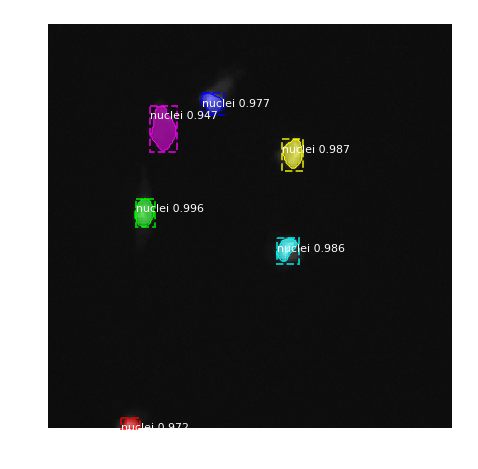

image  14  processed, bg type = black_white 
id = 31f1fbe85b8899258ea5bcf5f93f7ac8238660c386aeab40649c715bd2e38a0a


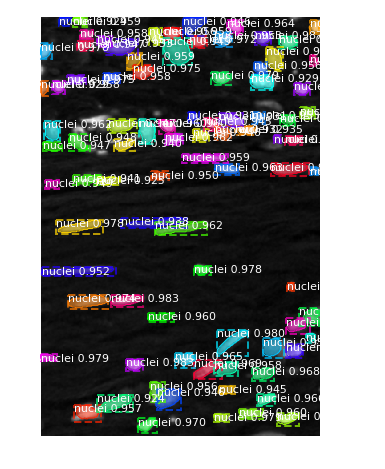

image  15  processed, bg type = yellow_purple 
id = 1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1


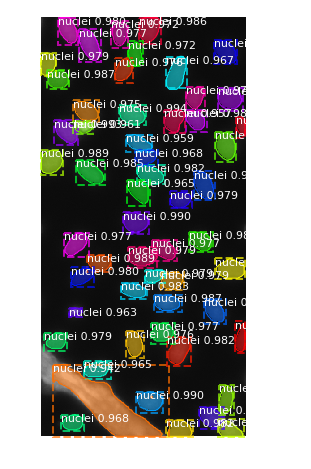

image  16  processed, bg type = black_white 
id = eea70a7948d25a9a791dbcb39228af4ea4049fe5ebdee9c04884be8cca3da835


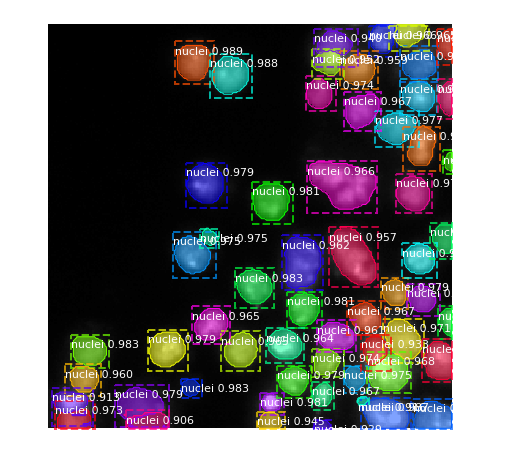

image  17  processed, bg type = black_white 
id = 697a05c6fe4a07c601d46da80885645ad574ea19b47ee795ccff216c9f1f1808


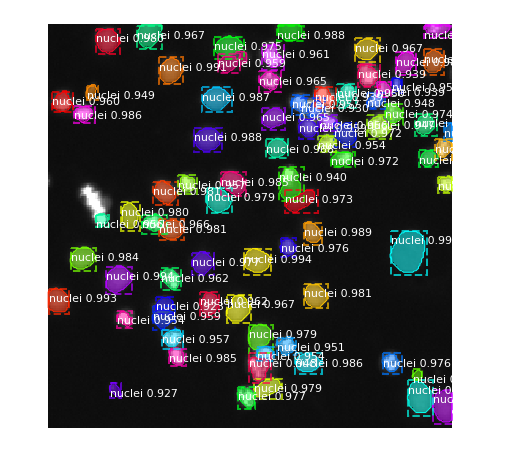

image  18  processed, bg type = black_white 
id = 912a679e4b9b1d1a75170254fd675b8c24b664d80ad7ea7e460241a23535a406


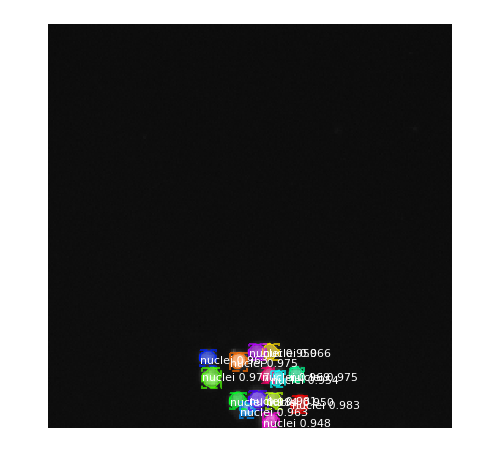

image  19  processed, bg type = black_white 
id = 4727d94c6a57ed484270fdd8bbc6e3d5f2f15d5476794a4e37a40f2309a091e2


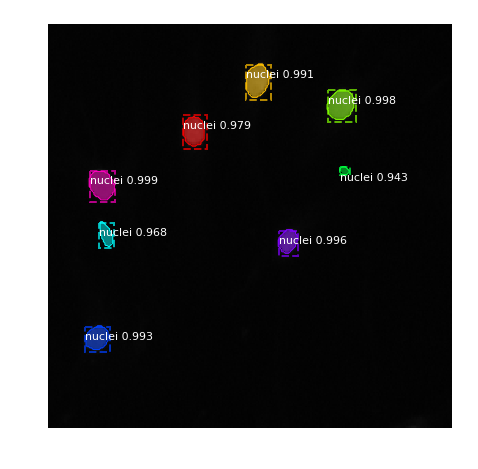

image  20  processed, bg type = black_white 
id = e17b7aedd251a016c01ef9158e6e4aa940d9f1b35942d86028dc1222192a9258


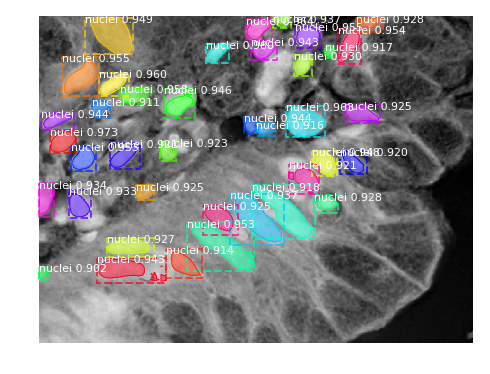

image  21  processed, bg type = white_purple 
id = 0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466


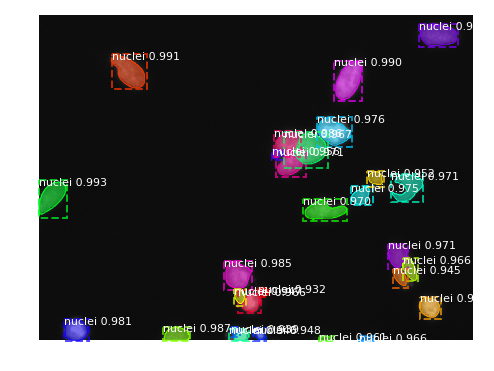

image  22  processed, bg type = black_white 
id = f0d0ab13ff53adc3c4d57e95a5f83d80b06f2cbc0bf002b52cf7b496612e0ce4


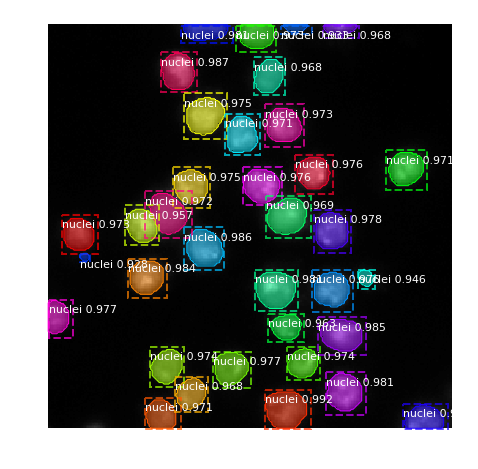

image  23  processed, bg type = black_white 
id = 7f4cbe0b36b5d09466476a7d4e01f4f976c67872d549f4ff47b3e1e3a2b403af


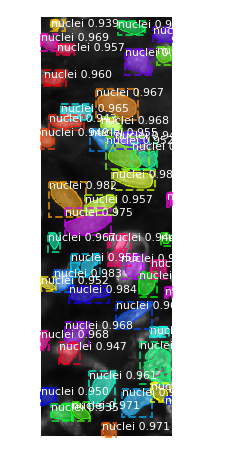

image  24  processed, bg type = black_white 
id = d616d323a9eeb9da1b66f8d5df671d63c092c9919cb2c0b223e29c63257c944d


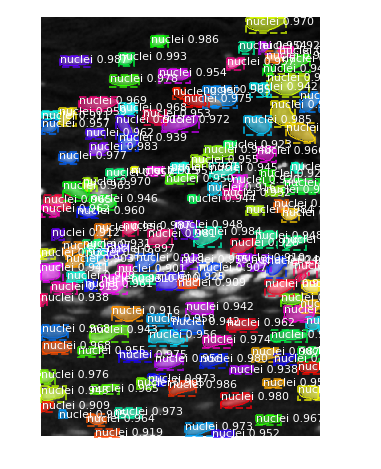

image  25  processed, bg type = yellow_purple 
id = 3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26


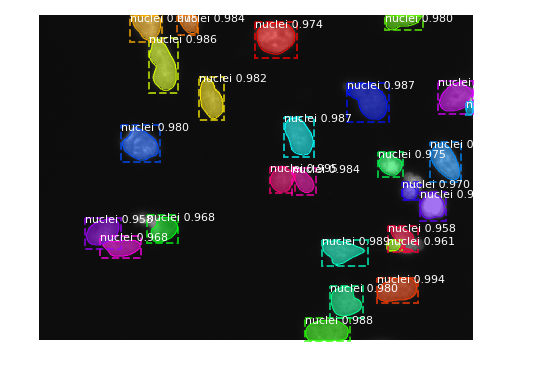

image  26  processed, bg type = black_white 
id = bdc789019cee8ddfae20d5f769299993b4b330b2d38d1218646cf89e77fbbd4d


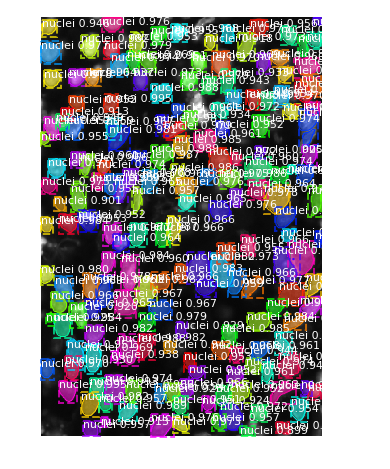

image  27  processed, bg type = black_white 
id = 550450e4bff4036fd671decdc5d42fec23578198d6a2fd79179c4368b9d6da18


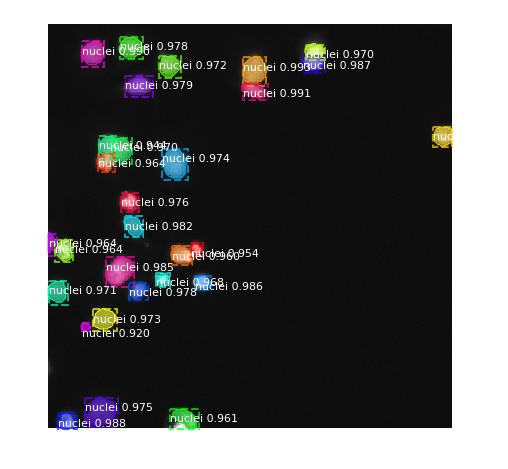

image  28  processed, bg type = black_white 
id = 1ef68e93964c2d9230100c1347c328f6385a7bc027879dc3d4c055e6fe80cb3c


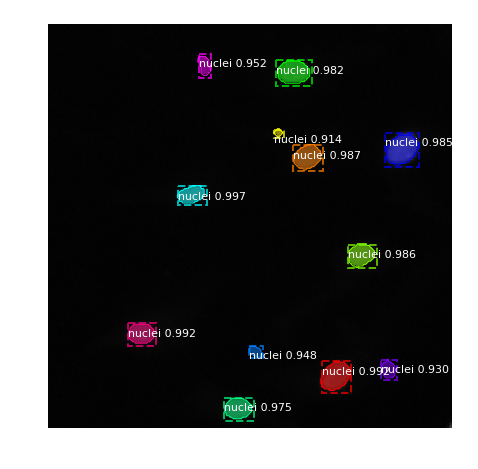

image  29  processed, bg type = black_white 
id = 191b2b2205f2f5cc9da04702c5d422bc249faf8bca1107af792da63cccfba829


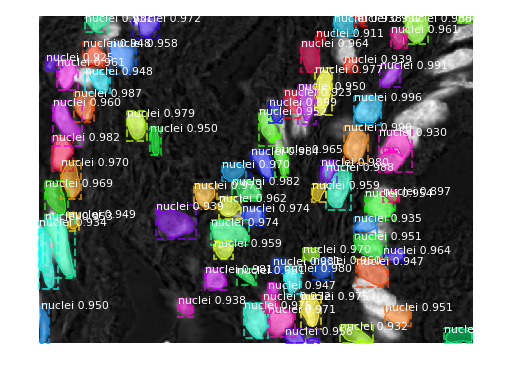

image  30  processed, bg type = yellow_purple 
id = da6c593410340b19bb212b9f6d274f95b08c0fc8f2570cd66bc5ed42c560acab


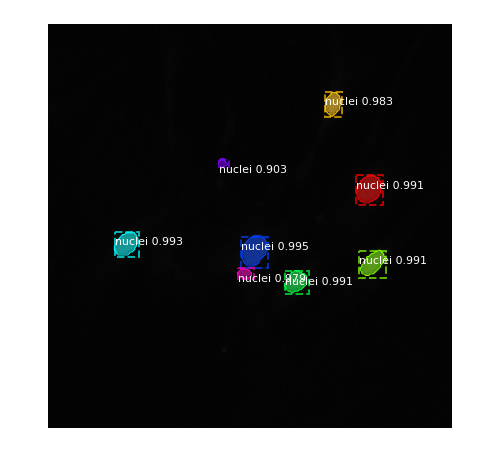

image  31  processed, bg type = black_white 
id = 0114f484a16c152baa2d82fdd43740880a762c93f436c8988ac461c5c9dbe7d5


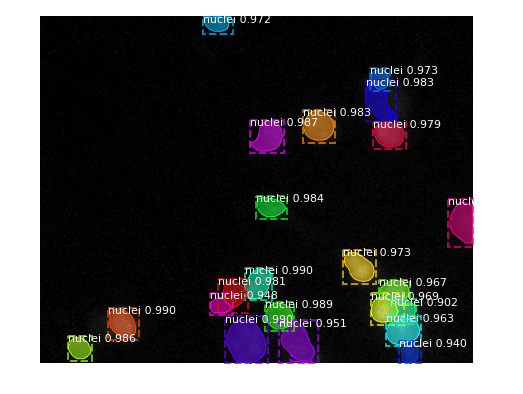

image  32  processed, bg type = black_white 
id = 8922a6ac8fd0258ec27738ca101867169b20d90a60fc84f93df77acd5bf7c80b


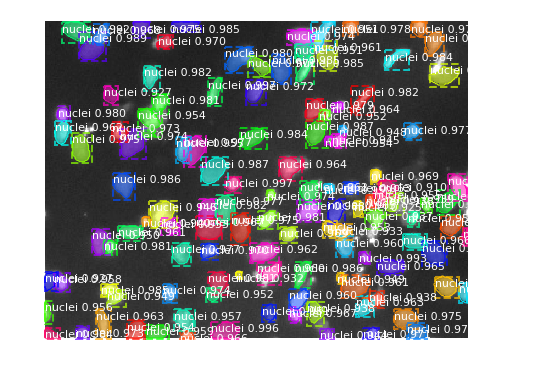

image  33  processed, bg type = black_white 
id = 52b267e20519174e3ce1e1994b5d677804b16bc670aa5f6ffb6344a0fdf63fde


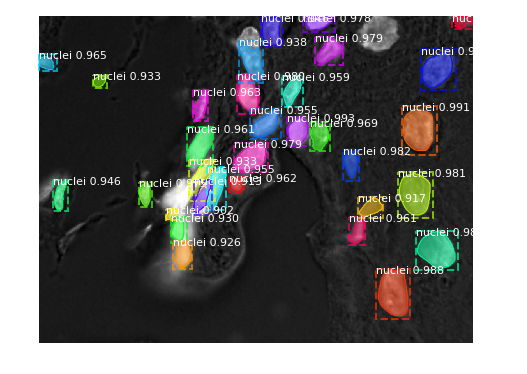

image  34  processed, bg type = yellow_purple 
id = 9f17aea854db13015d19b34cb2022cfdeda44133323fcd6bb3545f7b9404d8ab


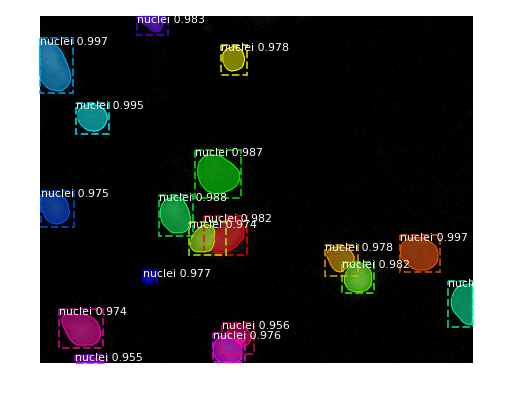

image  35  processed, bg type = black_white 
id = 1cdbfee1951356e7b0a215073828695fe1ead5f8b1add119b6645d2fdc8d844e


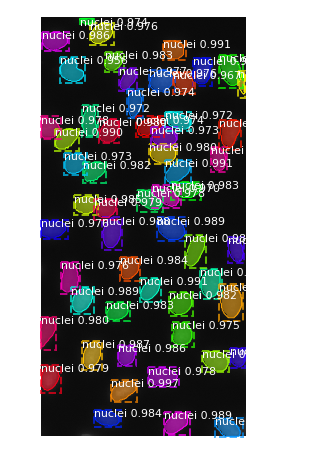

image  36  processed, bg type = black_white 
id = a4816cc1fb76cb3c5e481186833fc0ae9cf426a1406a2607e974e65e9cddba4f


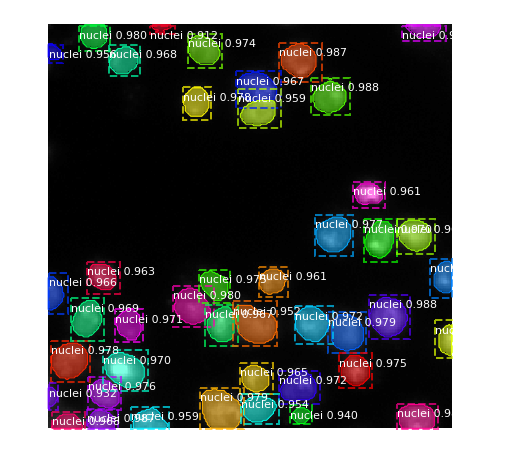

image  37  processed, bg type = black_white 
id = 4be73d68f433869188fe5e7f09c7f681ed51003da6aa5d19ce368726d8e271ee


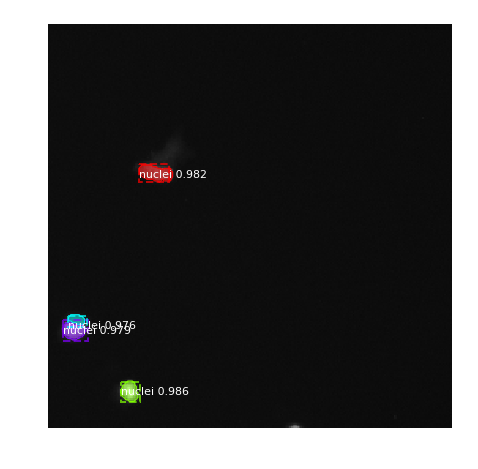

image  38  processed, bg type = black_white 
id = 648c8ffa496e1716017906d0bf135debfc93386ae86aa3d4adbda9a505985fd9


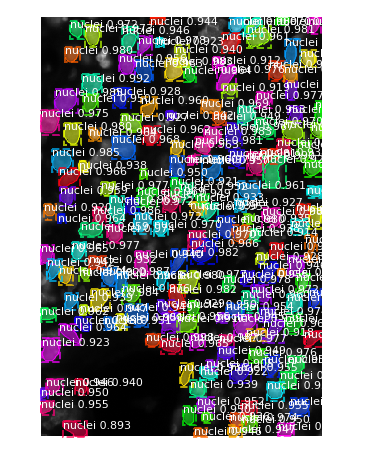

image  39  processed, bg type = black_white 
id = d6eb7ce7723e2f6dc13b90b41a29ded27dbd815bad633fdf582447c686018896


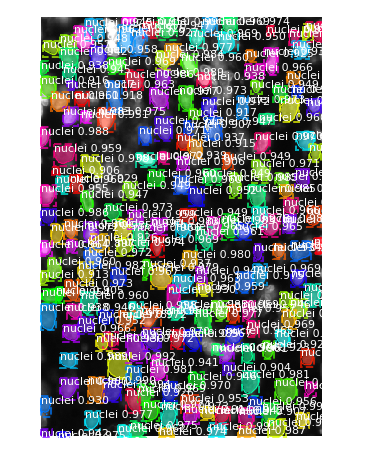

image  40  processed, bg type = black_white 
id = 432f367a4c5b5674de2e2977744d10289a064e5704b21af6607b4975be47c580


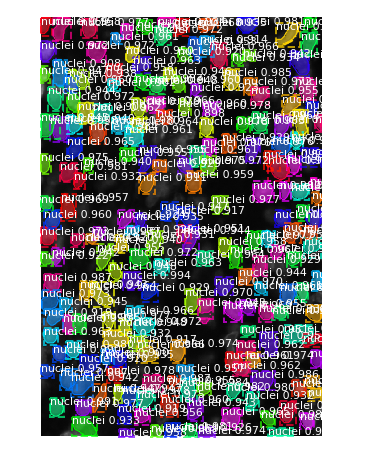

image  41  processed, bg type = black_white 
id = 78a981bd27ba0c65a9169548665a17bda9f49050d0d3893a6567d1eb92cd003d


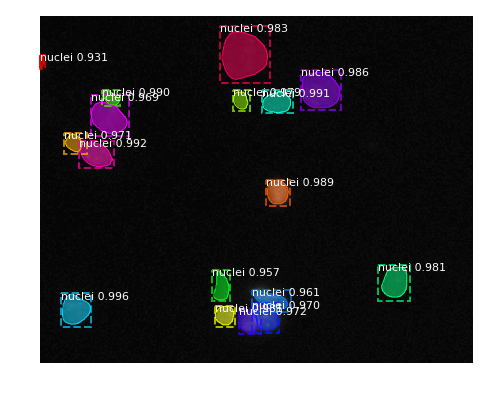

image  42  processed, bg type = black_white 
id = 5cee644e5ffbef1ba021c7f389b33bafd3b1841f04d3edd7922d5084c2c4e0c7


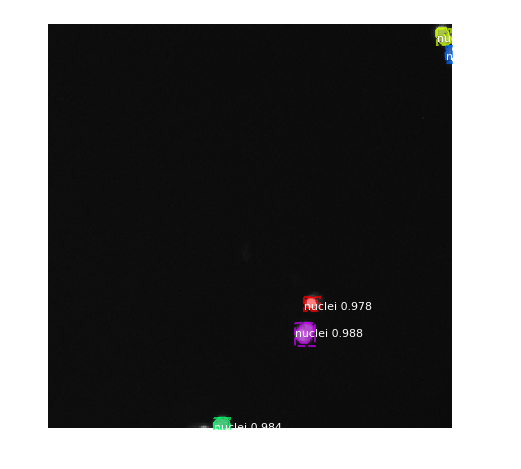

image  43  processed, bg type = black_white 
id = 51c70bb8a299943b27f8b354571272692d8f2705036a1a9562156c76da5f025b


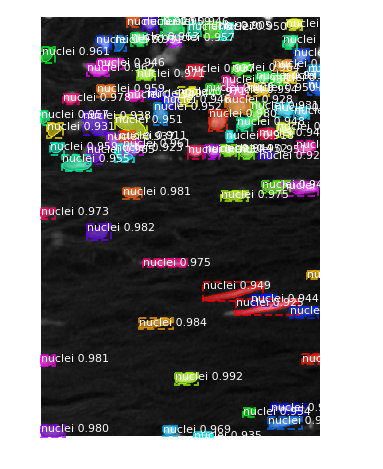

image  44  processed, bg type = yellow_purple 
id = c8e79ff4ac55f4b772057de28e539727b7f4f2a3de73bf7a082a0ace86d609eb


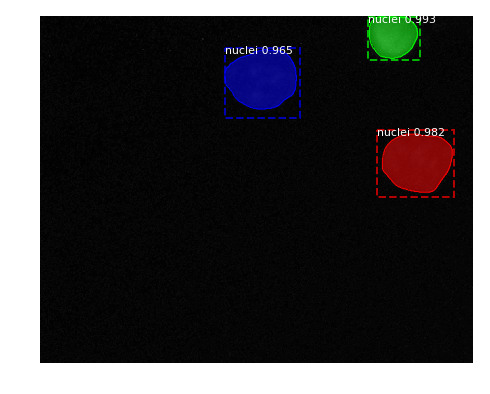

image  45  processed, bg type = black_white 
id = 9ab2d381f90b485a68b82bc07f94397a0373e3215ad20935a958738e55f3cfc2


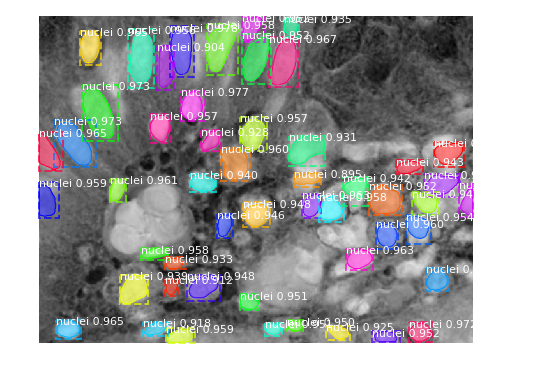

image  46  processed, bg type = purple_purple 
id = 472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71


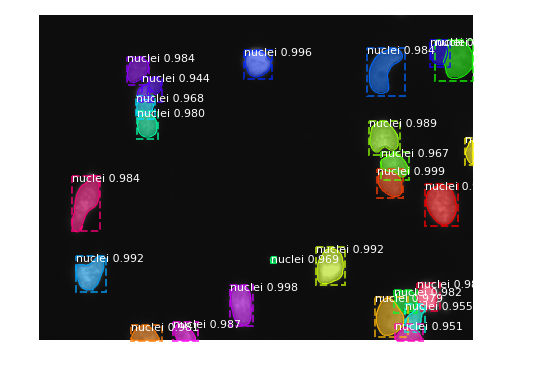

image  47  processed, bg type = black_white 
id = ade080c6618cbbb0a25680cf847f312b5e19b22bfe1cafec0436987ebe5b1e7e


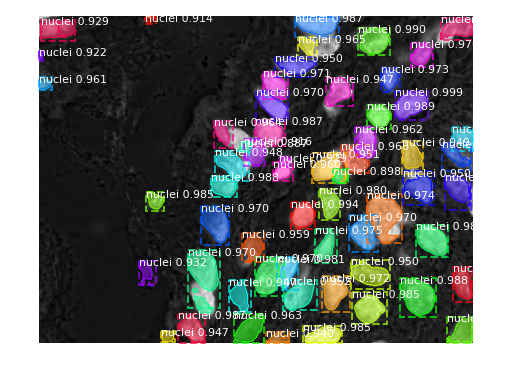

image  48  processed, bg type = yellow_purple 
id = 44afae184c89e6ba55985b4d341acc1ae1e8b6ef96312064e0e6e630e022b078


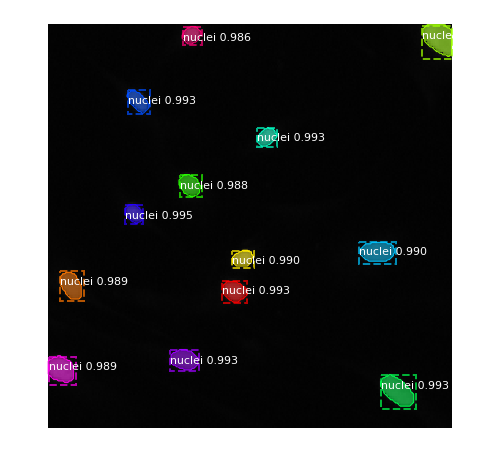

image  49  processed, bg type = black_white 
id = 53df5150ee56253fe5bc91a9230d377bb21f1300f443ba45a758bcb01a15c0e4


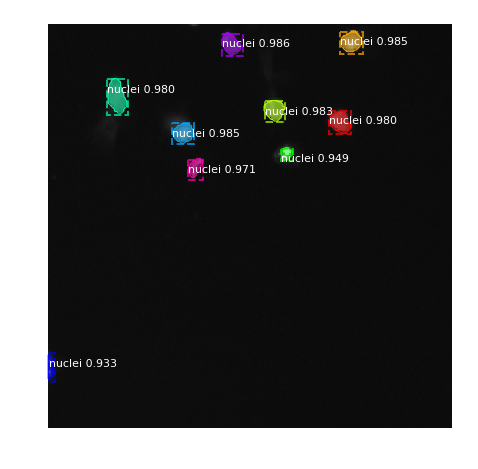

image  50  processed, bg type = black_white 
id = 0e132f71c8b4875c3c2dd7a22997468a3e842b46aa9bd47cf7b0e8b7d63f0925


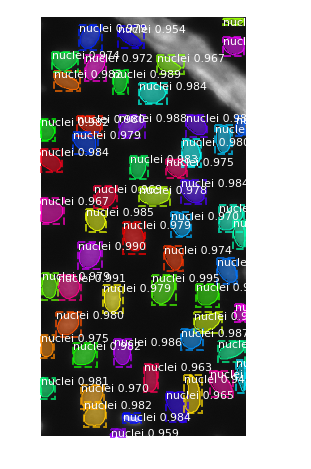

image  51  processed, bg type = black_white 
id = 0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac


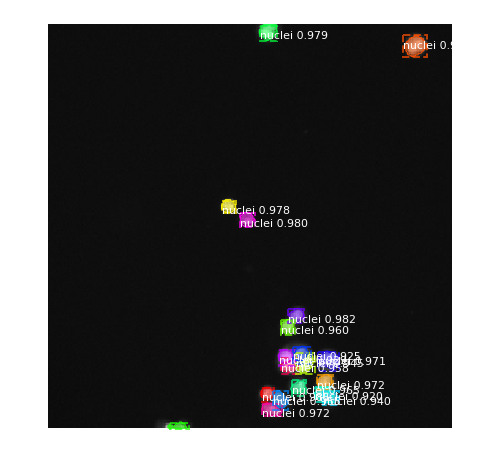

image  52  processed, bg type = black_white 
id = 0ed3555a4bd48046d3b63d8baf03a5aa97e523aa483aaa07459e7afa39fb96c6


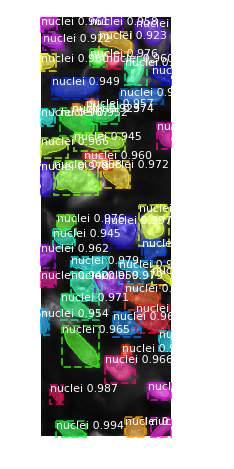

image  53  processed, bg type = black_white 
id = a984e7fb886aa02e29d112766d3ce26a4f78eac540ce7bbdbd42af2761928f6d


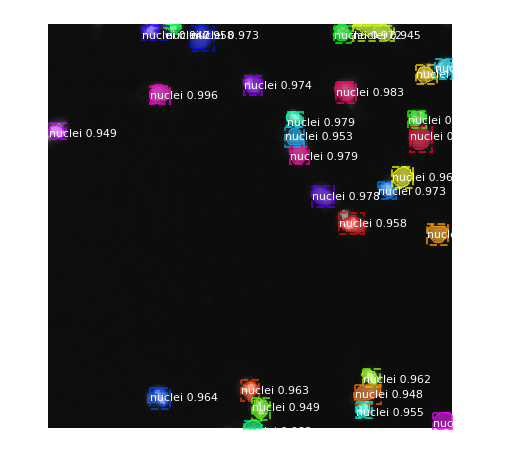

image  54  processed, bg type = black_white 
id = fac507fa4d1649e8b24c195d990f1fc3ca3633d917839e1751a9d412a14ab5e3


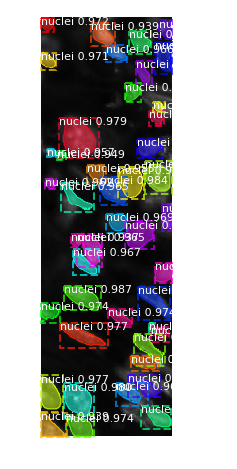

image  55  processed, bg type = black_white 
id = 1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a


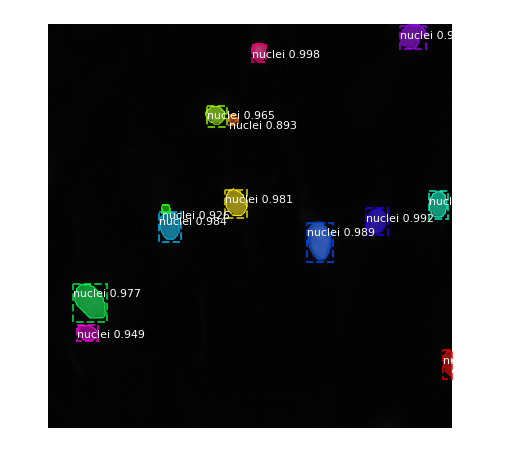

image  56  processed, bg type = black_white 
id = 519dc0d672d1c295fc69b629af8721ccb1a1f136d1976685a68487e62547ffe0


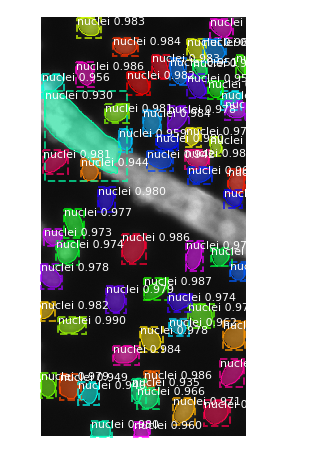

image  57  processed, bg type = black_white 
id = 336d3e4105766f8ad328a7ee9571e743f376f8cbcf6a969ca7e353fe3235c523


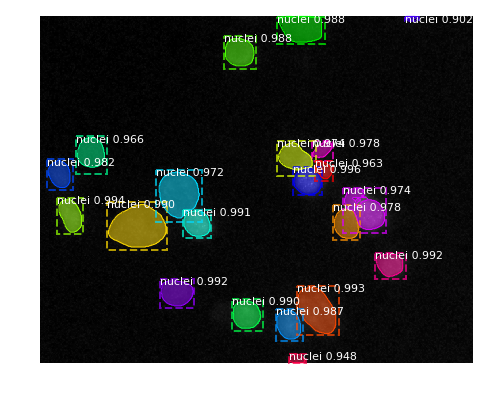

image  58  processed, bg type = black_white 
id = 1747f62148a919c8feb6d607faeebdf504b5e2ad42b6b1710b1189c37ebcdb2c


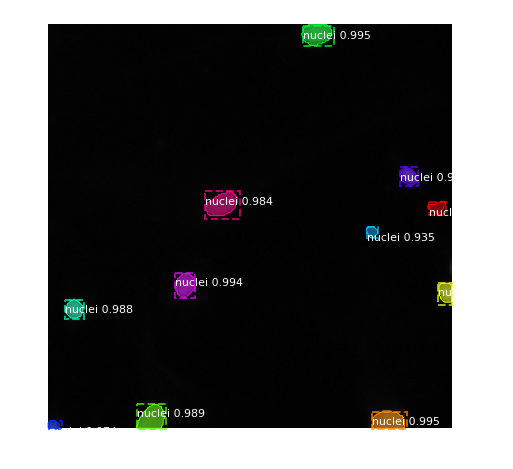

image  59  processed, bg type = black_white 
id = ab298b962a63e4be9582513aaa84a5e270adba5fd2b16a50e59540524f63c3b8


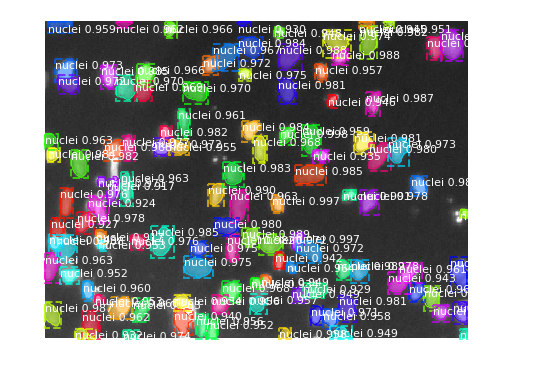

image  60  processed, bg type = black_white 
id = 699f2992cd71e2e28cf45f81347ff22e76b37541ce88087742884cd0e9aadc68


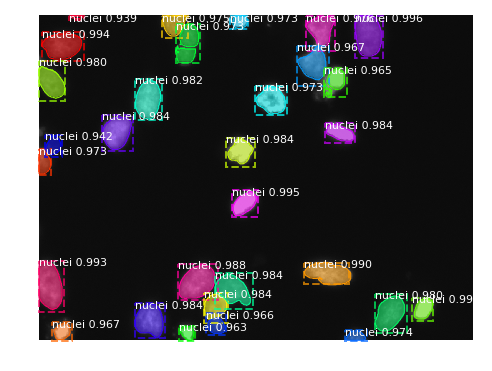

image  61  processed, bg type = black_white 
id = 8b59819fbc92eefe45b1db95c0cc3a467ddcfc755684c7f2ba2f6ccb9ad740ab


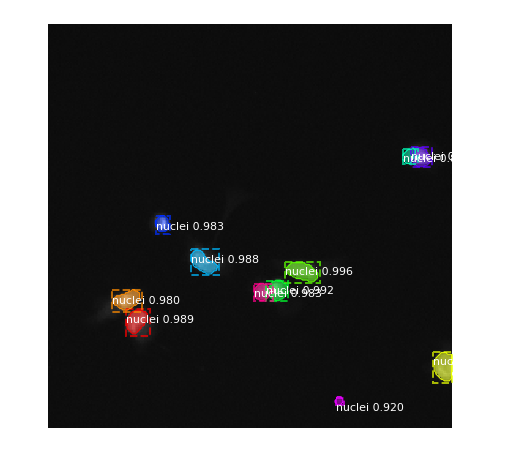

image  62  processed, bg type = black_white 
id = 295682d9eb5acb5c1976a460c085734bfaf38482b0a3f02591c2bfdcd4128549


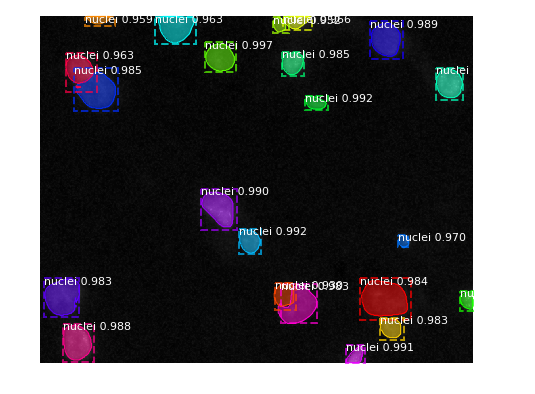

image  63  processed, bg type = black_white 
id = 7bdb668e6127b7eafc837a883f0648002bd063c736f55a4f673e787250a3fb04


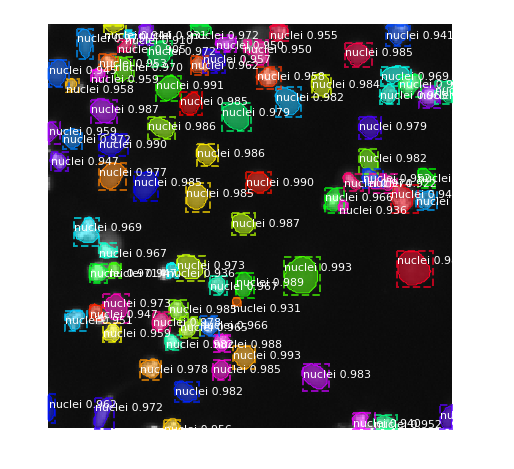

image  64  processed, bg type = black_white 
id = fe9adb627a6f45747c5a8223b671774791ededf9364f6544be487c540107fa4f


In [37]:
TESTING_BATCH_SIZE = 100
TO_VISUALIZE =True

for i in range(1):
    test_index = i
    dataset_test = test_datasets[test_index]
 
    processed_count = 0
    while processed_count < len(dataset_test.image_ids):
        
        selected_test_ids = dataset_test.image_ids[processed_count:processed_count+TESTING_BATCH_SIZE]
        #print(meta_test_groups[test_index].ImageId.values[processed_count:processed_count+TESTING_BATCH_SIZE])
        
        res = ps.ensemble_other_predictions([ps2], 
                          meta_test_groups[test_index].ImageId.values[processed_count:processed_count+TESTING_BATCH_SIZE], 
                          inference_config.DETECTION_MIN_CONFIDENCE, 2, .0, # > 2*.5=1 => both
                          inference_config.SNMS_SIGMA)
        '''
        res = ps.finalize_predictions(meta_test_groups[test_index].ImageId.values[processed_count:processed_count+TESTING_BATCH_SIZE], 
                                      inference_config.DETECTION_MIN_CONFIDENCE, 4, .5, 
                                      inference_config.SNMS_SIGMA)
        '''
        # def finalize_predictions(self, min_confidence, total_vote_count, ratio, sigma)
        
        raw_predictions = []
        image_ids = []
        for x, test_id in enumerate(selected_test_ids):
            image_id = meta_test_groups[test_index].ImageId.values[x+processed_count]
            pred = res[x]
            '''
            data = {
               'boxes': res[i][0],
               'masks': res[i][1],
               'scores': res[i][2],
               'class_ids': res[i][3],
            }
            '''
            if TO_VISUALIZE is True:
                test_image = dataset_test.load_image(test_id, 0)
                visualize.display_instances(test_image, pred[0], pred[1], pred[3].astype(np.uint8), 
                                            dataset_test.class_names, pred[2], ax=get_ax())

            image_ids.append(image_id)
            raw_predictions.append((pred[1], pred[2]))
            print('image ', x+processed_count, 
                  ' processed, bg type =', meta_test_groups[test_index].bg_type.values[x+processed_count],
                  '\nid =', image_id)
        
        new_test_ids, rles = update_final_predictions(image_ids, raw_predictions, new_test_ids, rles)
        processed_count += len(selected_test_ids)

In [38]:
print('Summarize TTA Results takes {:.3f} secs'.format(time()-start_time))

Summarize TTA Results takes 636.255 secs


In [39]:
df = pd.DataFrame({ 'ImageId' : new_test_ids , 'EncodedPixels' : rles})
print(df.shape[0])
df.to_csv('output/submission_ci88_ensemble.csv', index=False, columns=['ImageId', 'EncodedPixels'])

3201
